# Project 2 Code Part 2 (Analysis)
### Name: Arata Fujii

In [11]:
import numpy as np
import os
import nltk
from nltk.corpus import stopwords
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from itertools import chain
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from fuzzywuzzy import fuzz
from sklearn.linear_model import LogisticRegression
from transformers import pipeline

# Data Prepping

In [12]:
#loading data
folder_path = '/Users/aratafujii/Desktop/Project2'
df = pd.read_csv(os.path.join(folder_path,"main_data.csv"), dtype=object)


In [13]:
df = df[['Date', 'Article Text', 'Category','Twitter Bert Sentiment', 'Bert Multilingual Sentiment', 'Xdistil Uncased Sentiment', 'Text Blob Sentiment', 'ESGB Difference 7', 'SUSB Difference 7', 'ESGB Difference 14', 'SUSB Difference 14']]
df.head(5)

,Date,Article Text,Category,Twitter Bert Sentiment,Bert Multilingual Sentiment,Xdistil Uncased Sentiment,Text Blob Sentiment,ESGB Difference 7,SUSB Difference 7,ESGB Difference 14,SUSB Difference 14
0,2022-08-30,Liz Truss will sign off on a push for more oil...,"{'policy', 'gas', 'change', 'climate', 'sea', ...",0.2888522,-0.7328868,0.59740806,-0.4516261628408015,-0.24512600000000262,-0.11328214285714111,-0.47640207142856994,-0.22088821428571492
1,2023-01-17,"Visits to parks, community gardens and other u...","{'policy', 'sea'}",0.5435481,-0.47481775,-0.6030576,-0.5811509313417711,0.18930985714285953,0.10834028571428789,0.45138971428571395,0.22792221428571224
2,2023-12-22,"I devised today’s nut roast for Oddbox, a veg ...","{'oil', 'water'}",0.17007732,0.09770739,0.9944005,-0.3047917055550644,0.10367028571427994,0.0708285714285708,0.2616714285714252,0.18005171428571032
3,2023-12-19,‘Constant companions to our gardening’A peacoc...,"{'wildlife', 'food', 'conservation'}",-0.526651,-0.018047333,0.96805215,-0.28639831289135304,0.27318414285714,0.14575571428571266,0.3999306428571394,0.21973728571428452
4,2022-04-05,The numerous bird feeders here are permanently...,"{'waste', 'coal'}",-0.12105274,-0.72564185,0.99802065,-0.3720894422230301,-0.3063657142857146,-0.08948171428571783,-0.4966435000000011,-0.17418585714285584


In [14]:
#independent var and dependent var lists for iteration
dep = ['ESGB Difference 7', 'SUSB Difference 7', 'ESGB Difference 14', 'SUSB Difference 14']
ind = ['Twitter Bert Sentiment', 'Bert Multilingual Sentiment','Xdistil Uncased Sentiment' ,'Text Blob Sentiment']
df[dep] = df[dep].astype(float)
df[ind] = df[ind].astype(float)

In [15]:
print(df[ind].describe().to_latex())

\begin{tabular}{lrrrr}
\toprule
 & Twitter Bert Sentiment & Bert Multilingual Sentiment & Xdistil Uncased Sentiment & Text Blob Sentiment \\
\midrule
count & 11634.000000 & 11634.000000 & 11634.000000 & 11634.000000 \\
mean & 0.000608 & -0.585962 & 0.713553 & -0.401870 \\
std & 0.391588 & 0.262175 & 0.409940 & 0.092864 \\
min & -1.000000 & -1.000000 & -1.000000 & -1.000000 \\
25% & -0.332336 & -0.788974 & 0.604936 & -0.458662 \\
50% & -0.010613 & -0.637147 & 0.922467 & -0.403787 \\
75% & 0.321786 & -0.431438 & 0.986705 & -0.347899 \\
max & 1.000000 & 1.000000 & 1.000000 & 1.000000 \\
\bottomrule
\end{tabular}



In [16]:
print(df[dep].describe().to_latex())

\begin{tabular}{lrrrr}
\toprule
 & ESGB Difference 7 & SUSB Difference 7 & ESGB Difference 14 & SUSB Difference 14 \\
\midrule
count & 11634.000000 & 11634.000000 & 11634.000000 & 11634.000000 \\
mean & -0.014331 & 0.003769 & -0.035366 & 0.000600 \\
std & 0.173429 & 0.093684 & 0.289196 & 0.156708 \\
min & -0.504517 & -0.327991 & -0.621234 & -0.349789 \\
25% & -0.144340 & -0.053552 & -0.254459 & -0.093538 \\
50% & -0.023743 & 0.000138 & -0.043829 & -0.020854 \\
75% & 0.092777 & 0.052945 & 0.105466 & 0.086662 \\
max & 0.424953 & 0.285264 & 0.609189 & 0.341391 \\
\bottomrule
\end{tabular}



# Scatterplots

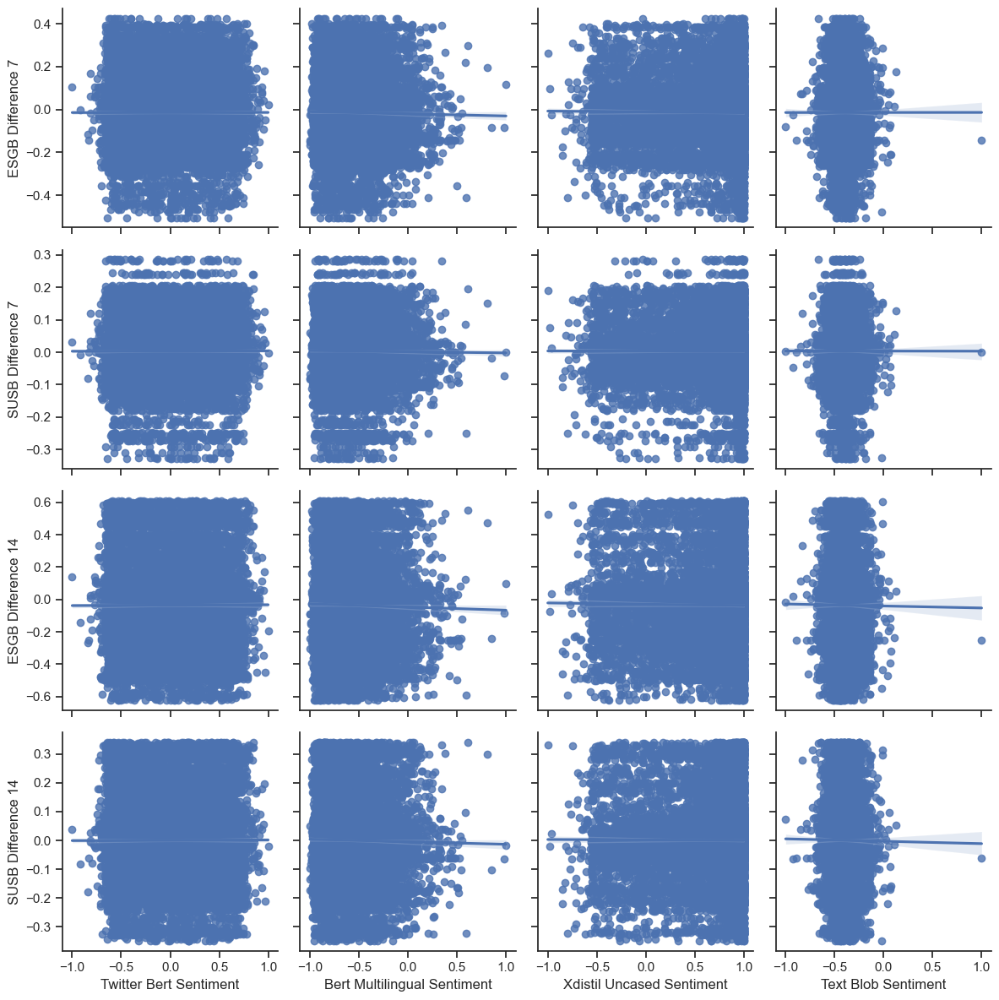

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

# set the style of seaborn
sns.set(style="ticks")

# create a pairplot with regression lines
sns.pairplot(df, x_vars=ind, y_vars=dep, kind='reg', height=3)
plt.tight_layout()
plt.savefig("scatterplots-main.png", format = 'png', dpi = 300)
plt.show()


# OLS regression

In [18]:
import statsmodels.api as sm
from statsmodels.iolib.summary2 import summary_col

# Initialize an empty list to store the regression results
results = []
df['constant'] = 1
ind_constant = ['Twitter Bert Sentiment', 'Bert Multilingual Sentiment', 'Xdistil Uncased Sentiment', 'Text Blob Sentiment', 'constant']

# Iterate over each column in columns
for col in dep:
    # Fit an OLS regression model for the current column
    model = sm.OLS(df[col], df[ind_constant])
    result = model.fit()
    
    # Append the regression result to the list of results
    results.append(result)

# Create a summary table of regression results
table = summary_col(results, stars=True,
                    float_format='%0.10f',
                    regressor_order=['constant'] + ind,
                    info_dict={'N': lambda x: "{0:d}".format(int(x.nobs))},
                    model_names=dep
                   )

# Print the summary table as LaTeX
print(table.as_latex())


\begin{table}
\caption{}
\label{}
\begin{center}
\begin{tabular}{lllll}
\hline
                            & ESGB Difference 7 & SUSB Difference 7 & ESGB Difference 14 & SUSB Difference 14  \\
\hline
constant                    & -0.0172699612**   & 0.0014513613      & -0.0456931087***   & -0.0069555324       \\
                            & (0.0086909630)    & (0.0046951878)    & (0.0144913159)     & (0.0078532346)      \\
Twitter Bert Sentiment      & 0.0006403861      & 0.0005645481      & 0.0032819688       & 0.0013252656        \\
                            & (0.0041335803)    & (0.0022331168)    & (0.0068923338)     & (0.0037351414)      \\
Bert Multilingual Sentiment & -0.0098317604     & -0.0036617875     & -0.0187025145*     & -0.0086449129       \\
                            & (0.0061504730)    & (0.0033227188)    & (0.0102553017)     & (0.0055576244)      \\
Xdistil Uncased Sentiment   & -0.0034619419     & 0.0000006399      & -0.0073899354      & -0.0012262934       \\
  

# Prepping category dictionary

In [29]:
target_words = {'government', 'water', 'climate', 'change', 'energy', 'emission', 'gas', 
                'carbon', 'environment', 'food', 'crisis', 'oil', 'air', 'sea', 'plastic', 'pollution',
                'coal', 'temperature', 'wildlife', 'forest', 'fire', 'policy', 'conservation', 'oceans', 'climate',
                'recycling','waste', 'deforestation', 'renewable'}

category_dfs = {}

# iterate over each category
for category in target_words:
    # filter the df for each category
    category_dfs[category] = df[df['Category'].apply(lambda x: category in x)]

# testing if worked
category_dfs['climate'].head(10)

,Date,Article Text,Category,Twitter Bert Sentiment,Bert Multilingual Sentiment,Xdistil Uncased Sentiment,Text Blob Sentiment,ESGB Difference 7,SUSB Difference 7,ESGB Difference 14,SUSB Difference 14,constant
0,2022-08-30,Liz Truss will sign off on a push for more oil...,"{'policy', 'gas', 'change', 'climate', 'sea', ...",0.288852,-0.732887,0.597408,-0.451626,-0.245126,-0.113282,-0.476402,-0.220888,1
5,2022-04-21,The climate crisis could lead to more small-bo...,"{'crisis', 'temperature', 'climate', 'food'}",-0.445036,-0.874443,0.991847,-0.404580,-0.148817,-0.081461,-0.434437,-0.148443,1
6,2022-01-20,Energy companies want the government to implem...,"{'temperature', 'renewable', 'gas', 'change', ...",0.519653,-0.721082,0.389863,-0.456577,-0.093798,-0.069965,-0.243412,-0.164642,1
8,2022-11-07,"Good morning. Last year, the Cop26 climate sum...","{'policy', 'change', 'environment', 'climate',...",0.371695,-0.731171,0.447567,-0.435706,0.181178,0.179256,0.398280,0.303923,1
10,2021-08-31,Small fires crackle into life on the hills aro...,"{'temperature', 'air', 'crisis', 'climate', 'f...",-0.143292,-0.642532,0.337266,-0.510114,0.017935,0.020308,0.048460,0.031138,1
11,2023-07-31,For as long as the United Kingdom needs to use...,"{'gas', 'crisis', 'climate', 'sea', 'carbon', ...",0.184739,-0.810036,0.763461,-0.387652,-0.124221,0.025485,-0.212935,-0.008910,1
12,2023-01-27,An area of ocean almost the size of Australia ...,"{'policy', 'gas', 'climate', 'food', 'water', ...",0.133221,-0.722921,-0.424303,-0.294371,0.059933,0.029201,0.010947,-0.000279,1
13,2023-09-12,The US accounts for more than a third of the e...,"{'policy', 'change', 'gas', 'environment', 'cr...",0.640829,-0.826203,0.646181,-0.415905,-0.036001,-0.008411,-0.178731,-0.039130,1
15,2023-06-21,"After decades in the wilderness, and familiar ...","{'policy', 'environment', 'climate', 'sea', 'g...",-0.239241,-0.938543,0.721788,-0.350427,0.028322,0.009742,-0.067209,-0.019399,1
16,2022-02-25,"This piece first appeared in Down to Earth, th...","{'crisis', 'environment', 'carbon', 'climate'}",0.669750,-0.727100,0.993659,-0.373767,0.083372,0.010522,-0.131348,-0.173124,1


# Scatter Plots for Categories

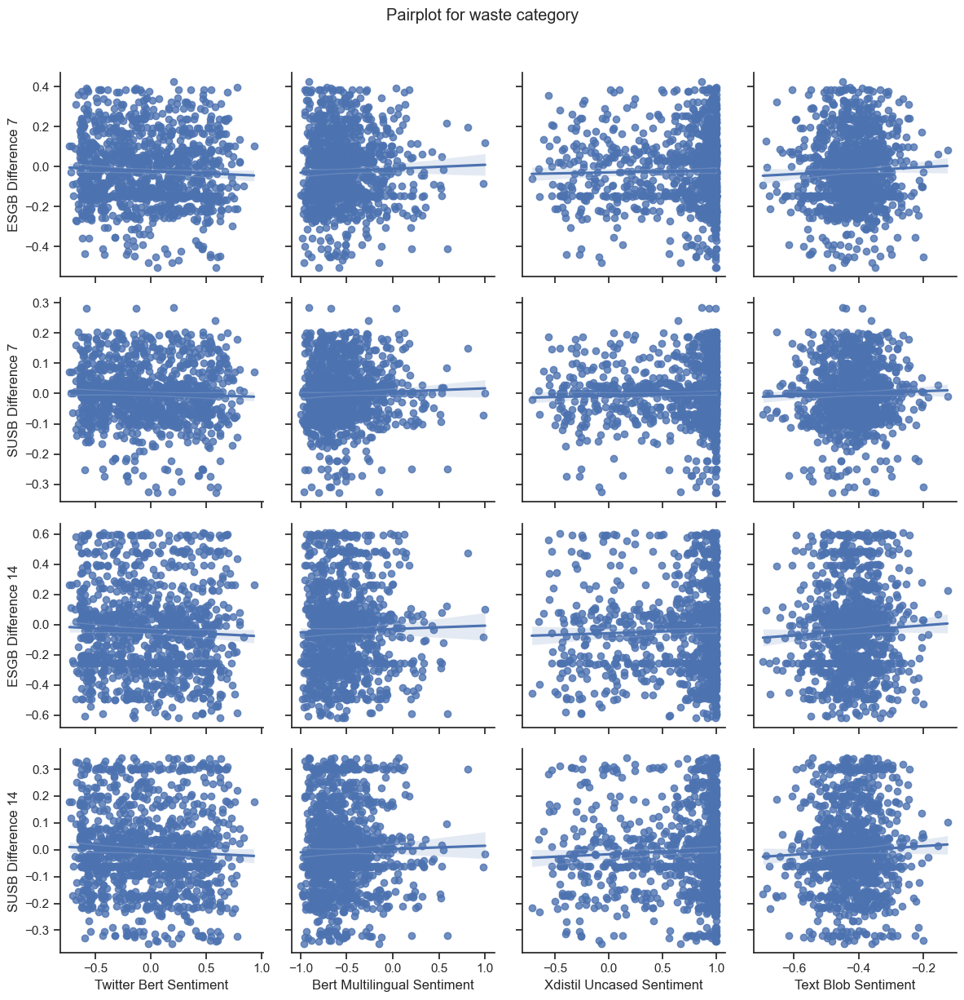

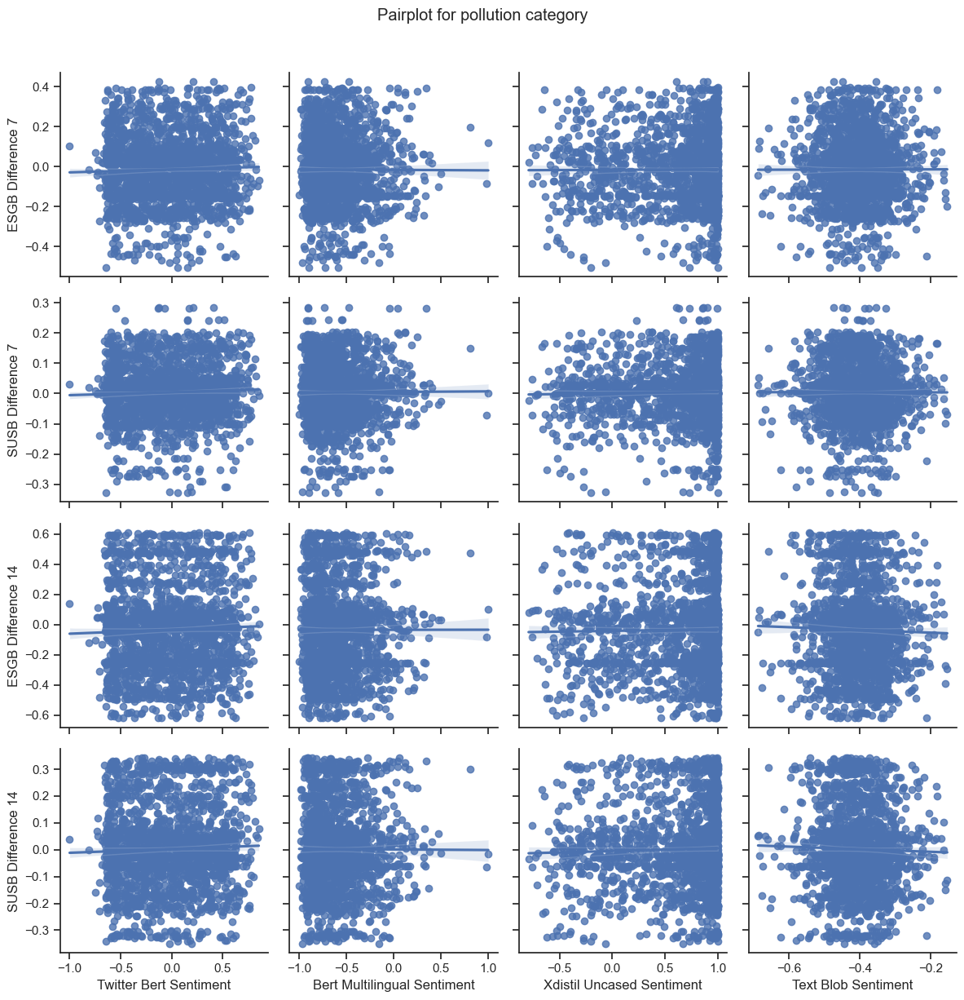

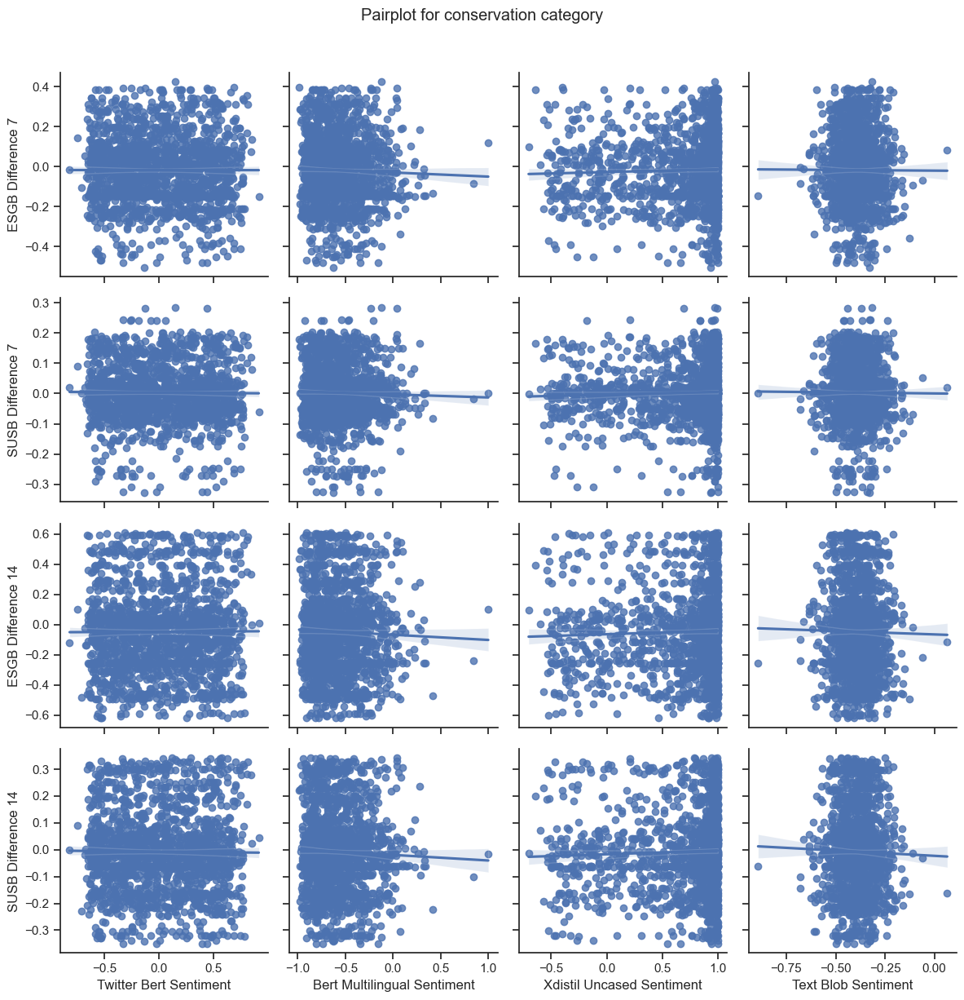

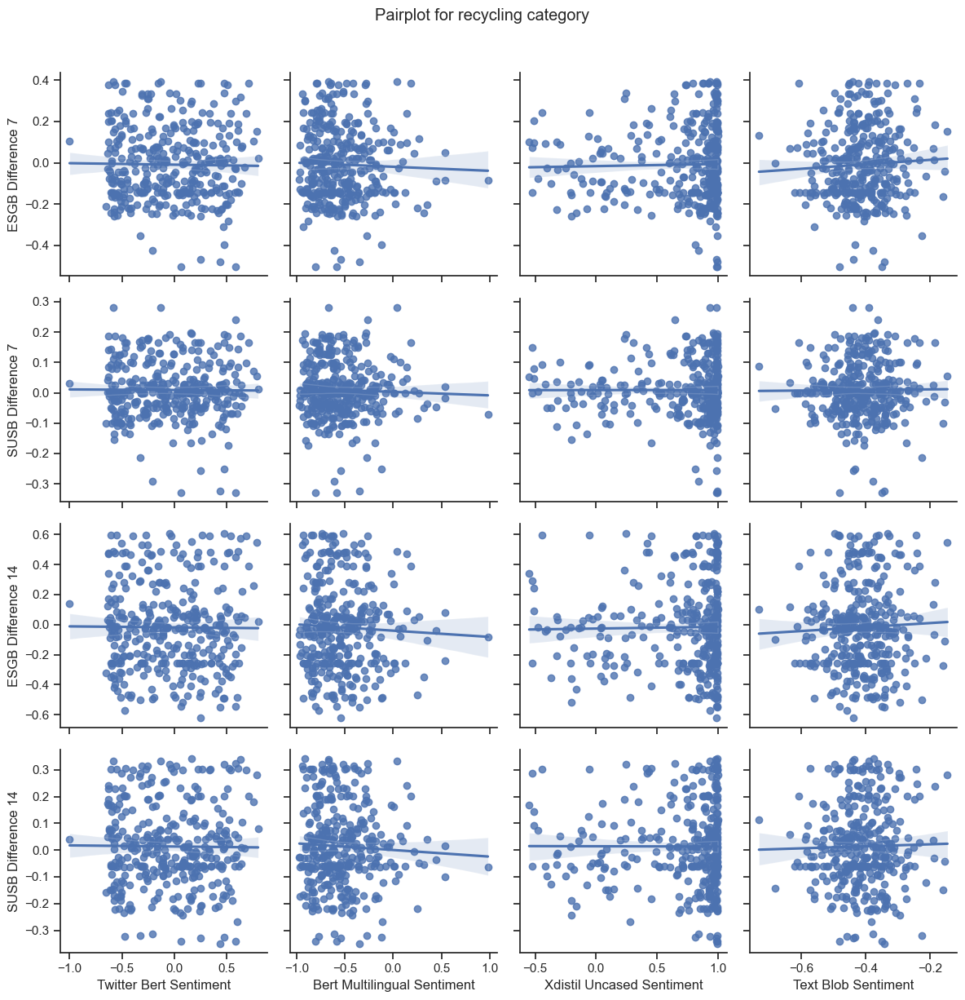

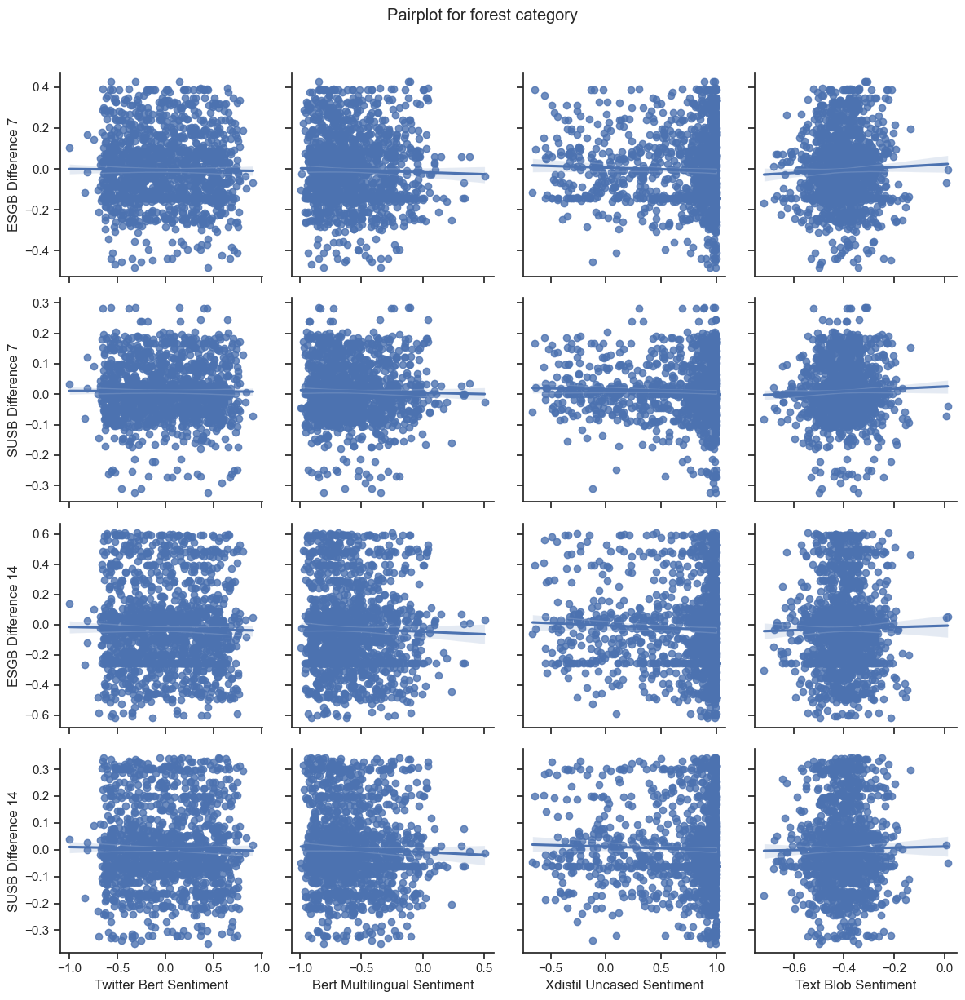

...

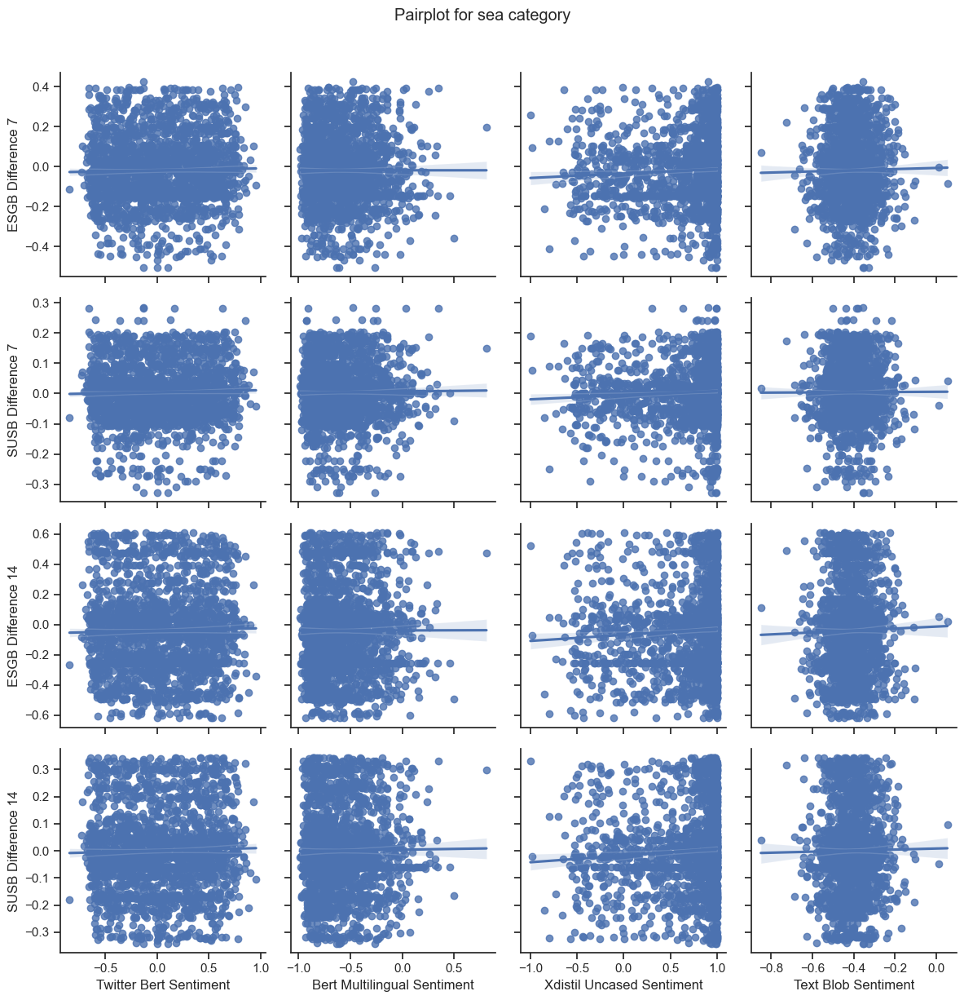

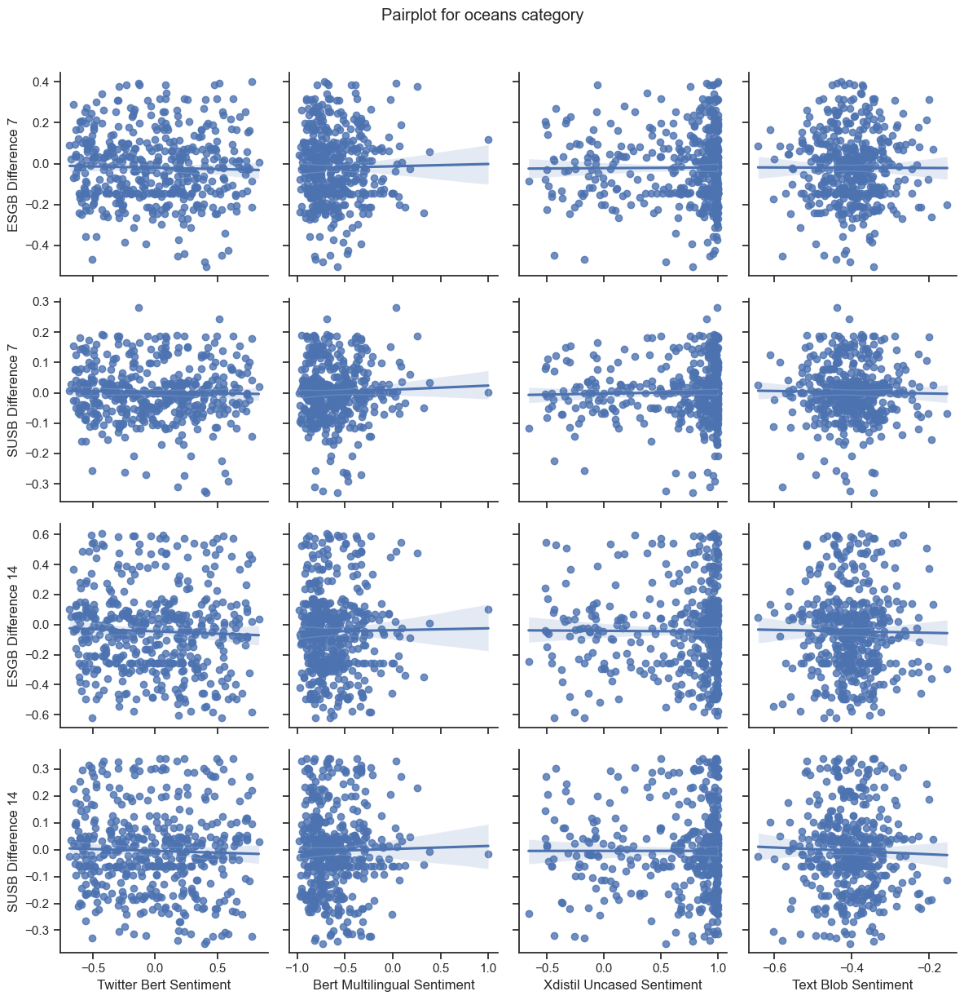

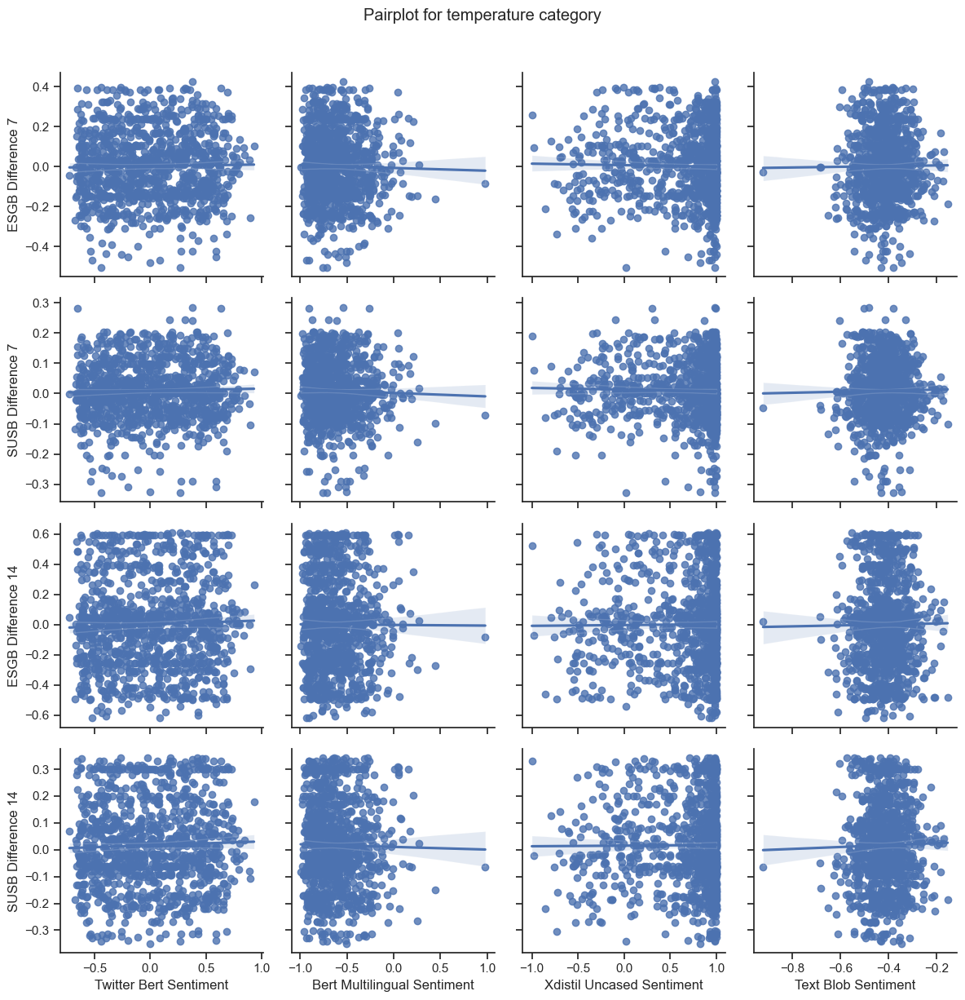

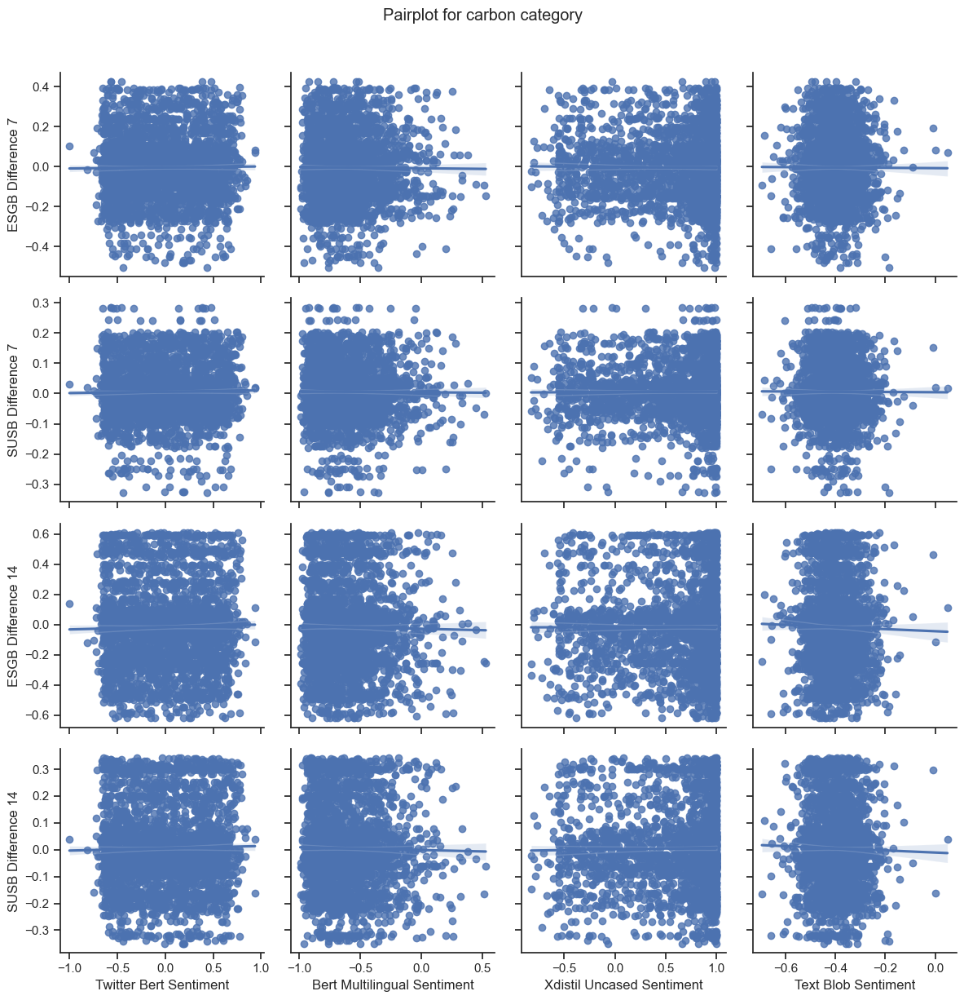

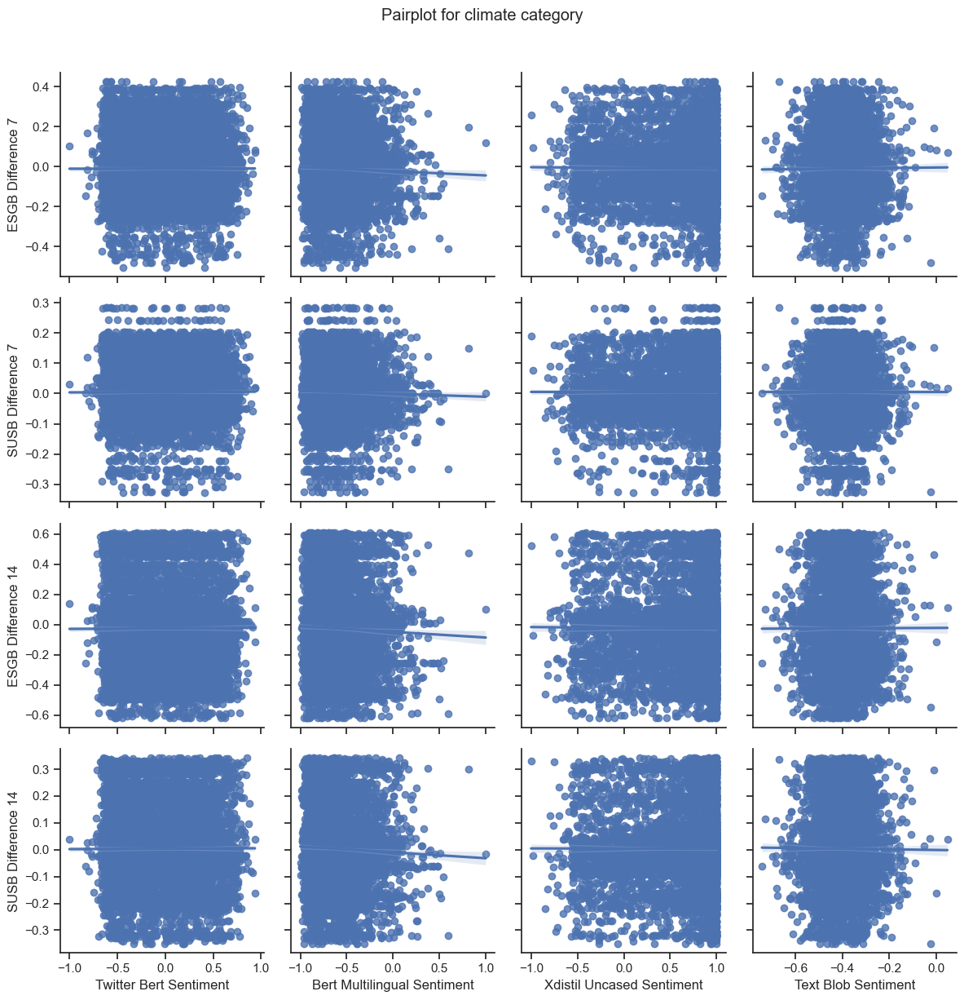

In [30]:
#iterate through categories and show scatter plots for each
for category in target_words:
    sns.set(style="ticks")
    pairplot = sns.pairplot(category_dfs[category], x_vars=ind, y_vars=dep, kind='reg', height=3)
    pairplot.fig.suptitle(f'Pairplot for {category} category', y=1.02)  # Adjust y to change the position of the title
    plt.savefig(f'{category}.png', format = 'png', dpi = 300)
    plt.tight_layout()
    plt.show()

# OLS for individual categories
Oil, gas, fire, deforestation, and plastic looked promising from the scatter plots.

In [21]:
#OIL
results = []

# iterate over each dependent variable
for col in dep:
    #run ols for each independent variable in the category df
    model = sm.OLS(category_dfs['oil'][col], category_dfs['oil'][ind_constant])
    result = model.fit()
    results.append(result)

#create summary table and display in latex
table = summary_col(results, stars=True,
                    float_format='%0.10f',
                    regressor_order=['constant'] + ind,
                    info_dict={'N': lambda x: "{0:d}".format(int(x.nobs))},
                    model_names=dep
                   )
print(table.as_latex())

\begin{table}
\caption{}
\label{}
\begin{center}
\begin{tabular}{lllll}
\hline
                            & ESGB Difference 7 & SUSB Difference 7 & ESGB Difference 14 & SUSB Difference 14  \\
\hline
constant                    & -0.0528939681**   & -0.0230482388     & -0.0994289330**    & -0.0419602266*      \\
                            & (0.0267080556)    & (0.0142815555)    & (0.0446627002)     & (0.0239670520)      \\
Twitter Bert Sentiment      & 0.0040426113      & 0.0033670942      & 0.0146994528       & 0.0070931581        \\
                            & (0.0105553865)    & (0.0056442648)    & (0.0176513059)     & (0.0094721046)      \\
Bert Multilingual Sentiment & -0.0013688637     & -0.0023967044     & -0.0061691889      & -0.0082191050       \\
                            & (0.0161046920)    & (0.0086116360)    & (0.0269311641)     & (0.0144518941)      \\
Xdistil Uncased Sentiment   & 0.0034631214      & 0.0063260291      & 0.0007934294       & 0.0040593151        \\
  

In [22]:
#GAS
results = []

# iterate over each dependent variable
for col in dep:
    #run ols for each independent variable in the category df
    model = sm.OLS(category_dfs['gas'][col], category_dfs['gas'][ind_constant])
    result = model.fit()
    results.append(result)

#create summary table and display in latex
table = summary_col(results, stars=True,
                    float_format='%0.10f',
                    regressor_order=['constant'] + ind,
                    info_dict={'N': lambda x: "{0:d}".format(int(x.nobs))},
                    model_names=dep
                   )
print(table.as_latex())

\begin{table}
\caption{}
\label{}
\begin{center}
\begin{tabular}{lllll}
\hline
                            & ESGB Difference 7 & SUSB Difference 7 & ESGB Difference 14 & SUSB Difference 14  \\
\hline
constant                    & -0.0473250287**   & -0.0220740529*    & -0.0915417717**    & -0.0440500520**     \\
                            & (0.0229260124)    & (0.0124909474)    & (0.0392404145)     & (0.0212575327)      \\
Twitter Bert Sentiment      & 0.0068242582      & 0.0027606146      & 0.0159781606       & 0.0065122762        \\
                            & (0.0086936082)    & (0.0047366023)    & (0.0148800752)     & (0.0080609160)      \\
Bert Multilingual Sentiment & 0.0001584149      & -0.0030699848     & -0.0051061168      & -0.0096460620       \\
                            & (0.0140258789)    & (0.0076418224)    & (0.0240068483)     & (0.0130051216)      \\
Xdistil Uncased Sentiment   & 0.0076185965      & 0.0066257716      & 0.0162685226       & 0.0117767796*       \\
  

In [23]:
#FIRE
results = []

# iterate over each dependent variable
for col in dep:
    #run ols for each independent variable in the category df
    model = sm.OLS(category_dfs['fire'][col], category_dfs['fire'][ind_constant])
    result = model.fit()
    results.append(result)

#create summary table and display in latex
table = summary_col(results, stars=True,
                    float_format='%0.10f',
                    regressor_order=['constant'] + ind,
                    info_dict={'N': lambda x: "{0:d}".format(int(x.nobs))},
                    model_names=dep
                   )
print(table.as_latex())

\begin{table}
\caption{}
\label{}
\begin{center}
\begin{tabular}{lllll}
\hline
                            & ESGB Difference 7 & SUSB Difference 7 & ESGB Difference 14 & SUSB Difference 14  \\
\hline
constant                    & 0.0989949278***   & 0.0624047191***   & 0.1034729153*      & 0.0741621445**      \\
                            & (0.0350556716)    & (0.0187017604)    & (0.0579268341)     & (0.0312350158)      \\
Twitter Bert Sentiment      & -0.0003752420     & 0.0039248432      & 0.0217924429       & 0.0181193857        \\
                            & (0.0148546060)    & (0.0079247457)    & (0.0245461079)     & (0.0132356287)      \\
Bert Multilingual Sentiment & 0.0036980446      & 0.0039363804      & 0.0022885099       & 0.0072142759        \\
                            & (0.0215603425)    & (0.0115021719)    & (0.0356268281)     & (0.0192105189)      \\
Xdistil Uncased Sentiment   & -0.0167006691     & -0.0079609420     & -0.0221914267      & -0.0126227853       \\
  

In [24]:
#DEFORESTATION
results = []

# iterate over each dependent variable
for col in dep:
    #run ols for each independent variable in the category df
    model = sm.OLS(category_dfs['deforestation'][col], category_dfs['deforestation'][ind_constant])
    result = model.fit()
    results.append(result)

#create summary table and display in latex
table = summary_col(results, stars=True,
                    float_format='%0.10f',
                    regressor_order=['constant'] + ind,
                    info_dict={'N': lambda x: "{0:d}".format(int(x.nobs))},
                    model_names=dep
                   )
print(table.as_latex())

\begin{table}
\caption{}
\label{}
\begin{center}
\begin{tabular}{lllll}
\hline
                            & ESGB Difference 7 & SUSB Difference 7 & ESGB Difference 14 & SUSB Difference 14  \\
\hline
constant                    & -0.0644741505     & -0.0056243360     & -0.1192103272      & -0.0261681286       \\
                            & (0.0450717862)    & (0.0232819224)    & (0.0769535652)     & (0.0407270017)      \\
Twitter Bert Sentiment      & -0.0135494430     & -0.0025617319     & -0.0261567408      & -0.0085836132       \\
                            & (0.0208010154)    & (0.0107448066)    & (0.0355147295)     & (0.0187958601)      \\
Bert Multilingual Sentiment & -0.0816753613***  & -0.0298984894*    & -0.1420883477***   & -0.0551133255**     \\
                            & (0.0307601899)    & (0.0158892384)    & (0.0525185815)     & (0.0277950001)      \\
Xdistil Uncased Sentiment   & 0.0003162941      & -0.0012180474     & -0.0177420922      & -0.0068196031       \\
  

In [25]:
#PLASTIC
results = []

# iterate over each dependent variable
for col in dep:
    #run ols for each independent variable in the category df
    model = sm.OLS(category_dfs['plastic'][col], category_dfs['plastic'][ind_constant])
    result = model.fit()
    results.append(result)

#create summary table and display in latex
table = summary_col(results, stars=True,
                    float_format='%0.10f',
                    regressor_order=['constant'] + ind,
                    info_dict={'N': lambda x: "{0:d}".format(int(x.nobs))},
                    model_names=dep
                   )
print(table.as_latex())

\begin{table}
\caption{}
\label{}
\begin{center}
\begin{tabular}{lllll}
\hline
                            & ESGB Difference 7 & SUSB Difference 7 & ESGB Difference 14 & SUSB Difference 14  \\
\hline
constant                    & 0.0527716759      & 0.0448588273**    & 0.0483236490       & 0.0461849100        \\
                            & (0.0388068426)    & (0.0205115243)    & (0.0628593292)     & (0.0340260875)      \\
Twitter Bert Sentiment      & 0.0055049695      & 0.0043460793      & -0.0099156789      & -0.0110598256       \\
                            & (0.0175419535)    & (0.0092718753)    & (0.0284144588)     & (0.0153808969)      \\
Bert Multilingual Sentiment & 0.0430692833*     & 0.0248482476**    & 0.0382870511       & 0.0190102227        \\
                            & (0.0233153977)    & (0.0123234542)    & (0.0377662845)     & (0.0204430897)      \\
Xdistil Uncased Sentiment   & 0.0267064176      & 0.0154050571      & 0.0328266139       & 0.0172935747        \\
  